In [1]:
# unzip the folder
import zipfile

zip_path = "/content/data.zip"
extract_to = "/content/custom_data"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print(f" Extracted to: {extract_to}")


 Extracted to: /content/custom_data


In [3]:
!wget -O /content/train_val_split.py https://raw.githubusercontent.com/EdjeElectronics/Train-and-Deploy-YOLO-Models/refs/heads/main/utils/train_val_split.py

# split train and validation
!python train_val_split.py --datapath="/content/custom_data/data" --train_pct=0.9

--2025-07-08 19:15:16--  https://raw.githubusercontent.com/EdjeElectronics/Train-and-Deploy-YOLO-Models/refs/heads/main/utils/train_val_split.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3203 (3.1K) [text/plain]
Saving to: ‘/content/train_val_split.py’

/content/train_val_ 100%[===================>]   3.13K  --.-KB/s    in 0s      

2025-07-08 19:15:16 (59.5 MB/s) - ‘/content/train_val_split.py’ saved [3203/3203]

Number of image files: 258
Number of annotation files: 258
Images moving to train: 232
Images moving to validation: 26


In [4]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 67.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 129.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 92.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 100.4 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstallin

In [5]:
import yaml
import os

def  create_data_yaml(path_to_classes_txt,path_to_data_yaml):
  #to reading the classes from classes.txt
  if not os.path.exists(path_to_classes_txt):
    print(f"classes.txt not found!")
    return
  with open(path_to_classes_txt,'r') as f:
    classes=[]
    for line in f.readlines():
      if len(line.strip()) == 0 : continue
      classes.append(line.strip())
  number_of_classes = len(classes)

  #create  data directory
  data={
      'path':'/content/data',
      'train':'train/images',
      'val':'validation/images',
      'nc':number_of_classes,
      'names':classes
  }

  #write data to yaml file
  with open(path_to_data_yaml,'w') as f:
    yaml.dump(data,f,sort_keys=False)
  print(f'create config file at {path_to_data_yaml}')

  return

path_to_classes_txt='/content/custom_data/data/classes.txt'
path_to_data_yaml='/content/data.yaml'

create_data_yaml(path_to_classes_txt,path_to_data_yaml)

print('\nfile Contents:\n')
!cat /content/data.yaml

create config file at /content/data.yaml

file Contents:

path: /content/data
train: train/images
val: validation/images
nc: 5
names:
- auto
- bike
- car
- lorry
- plate


In [7]:
!yolo detect train data=/content/data.yaml model=yolo11m.pt epochs=40 imgsz=640

100% 38.8M/38.8M [00:00<00:00, 403MB/s]
Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plo

In [8]:
!yolo detect predict model=runs/detect/train/weights/best.pt source=data/validation/images save=True

Ultralytics 8.3.163 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11m summary (fused): 125 layers, 20,033,887 parameters, 0 gradients, 67.7 GFLOPs

image 1/26 /content/data/validation/images/004bc598-car_72.jpg: 384x640 1 car, 75.6ms
image 2/26 /content/data/validation/images/120219a4-auto_24.jpg: 640x640 1 auto, 1 plate, 37.7ms
image 3/26 /content/data/validation/images/17c83084-car_10.jpg: 352x640 1 car, 1 plate, 46.9ms
image 4/26 /content/data/validation/images/18542b74-bike_86.jpg: 480x640 1 bike, 49.7ms
image 5/26 /content/data/validation/images/2b1c9513-car_1.jpg: 384x640 1 car, 24.6ms
image 6/26 /content/data/validation/images/3407a0b9-car_21.jpg: 352x640 1 car, 1 plate, 24.4ms
image 7/26 /content/data/validation/images/3bf02338-auto_18.jpg: 608x640 2 autos, 50.3ms
image 8/26 /content/data/validation/images/4921ddf1-bike_77.jpg: 480x640 1 bike, 29.9ms
image 9/26 /content/data/validation/images/609a5712-lorry_31.jpg: 640x480 1 lorry, 1 plate, 45.5ms
image 10/

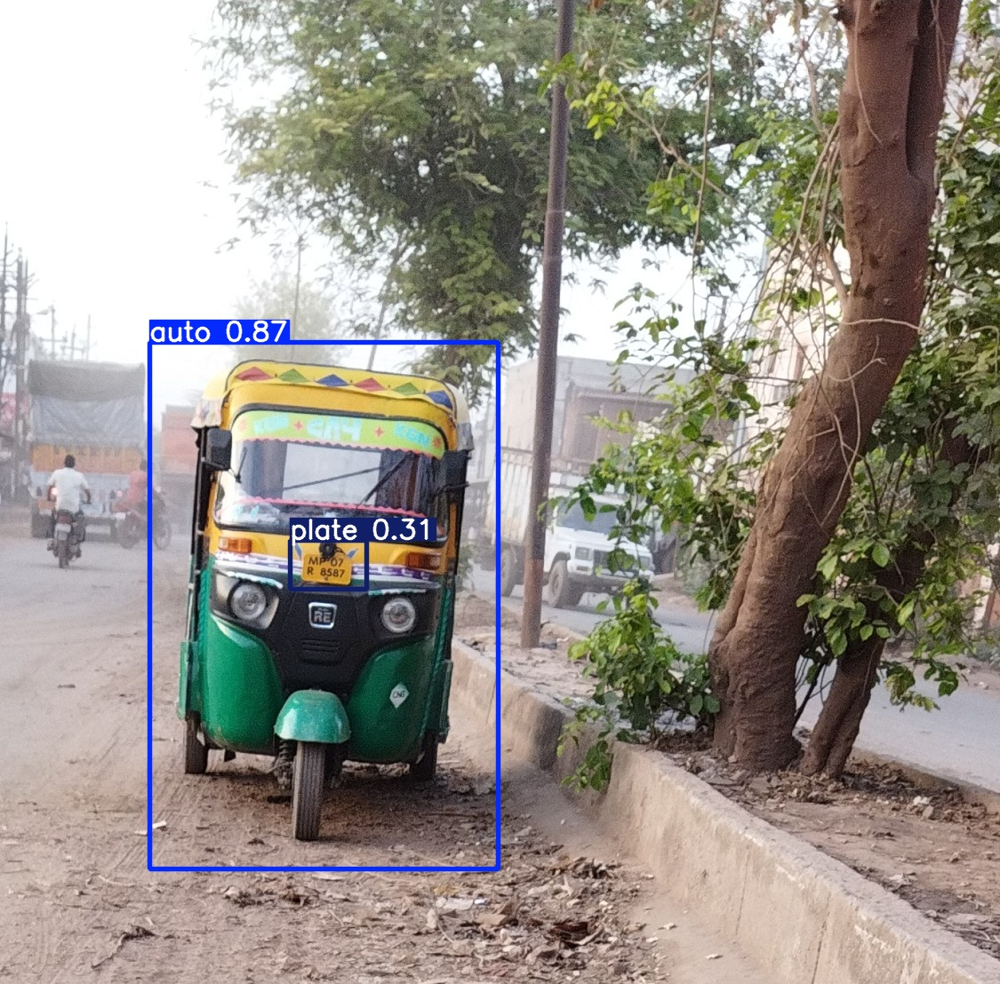

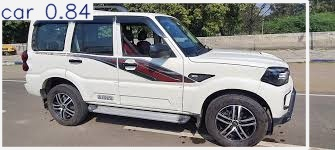

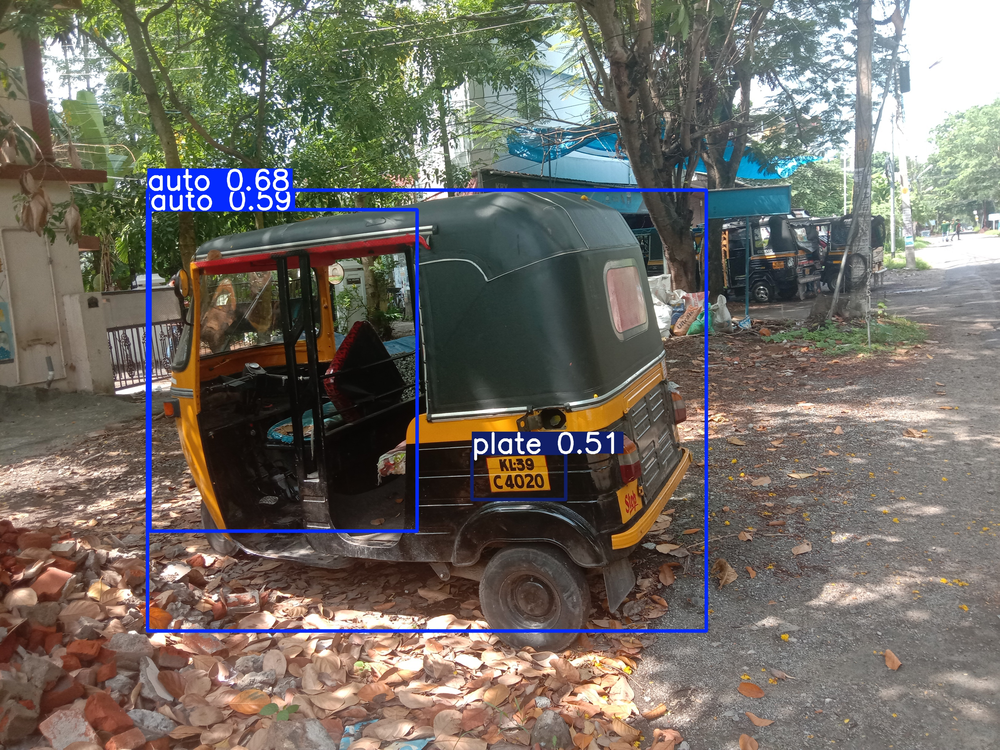

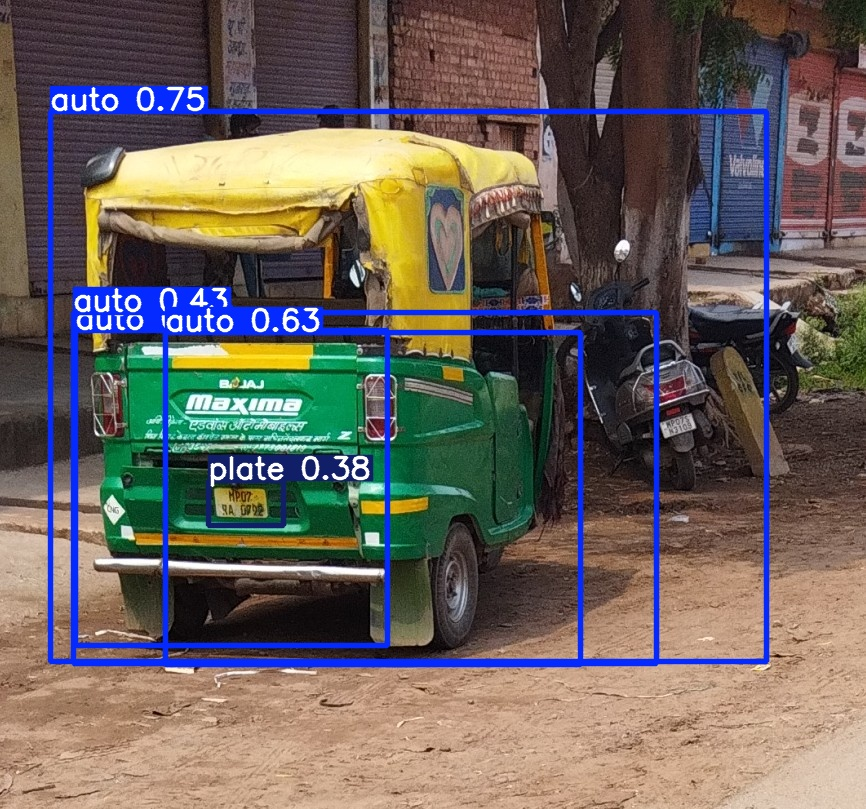

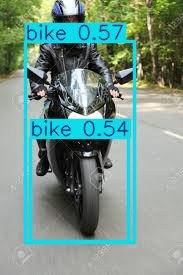

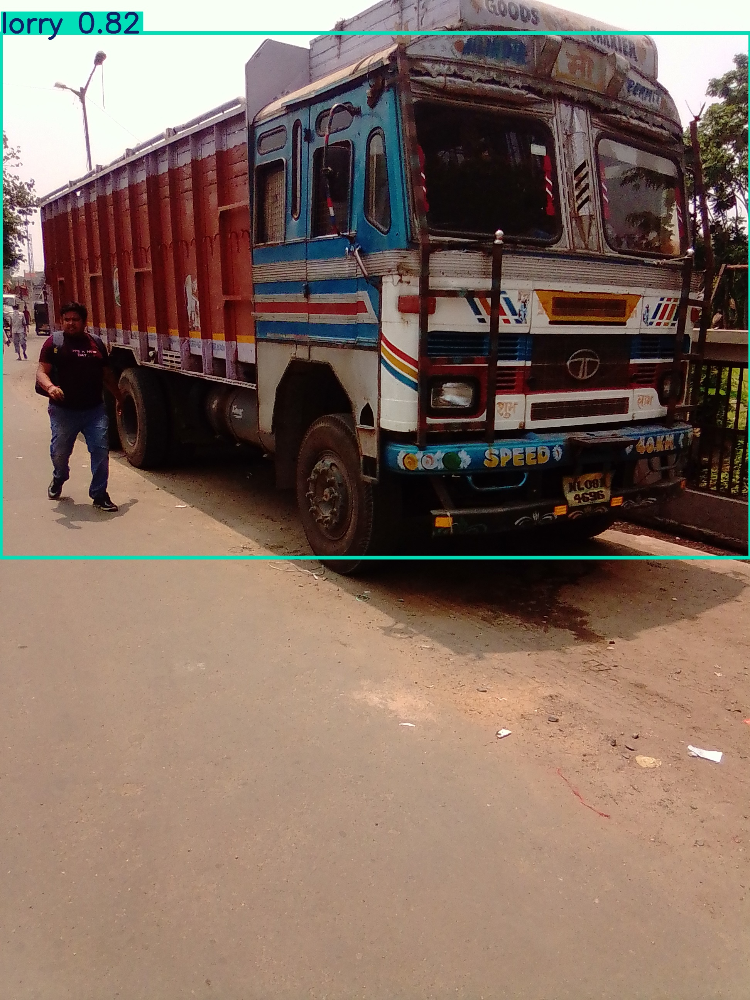

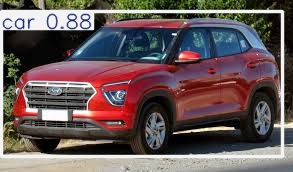

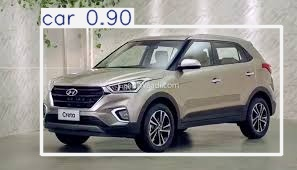

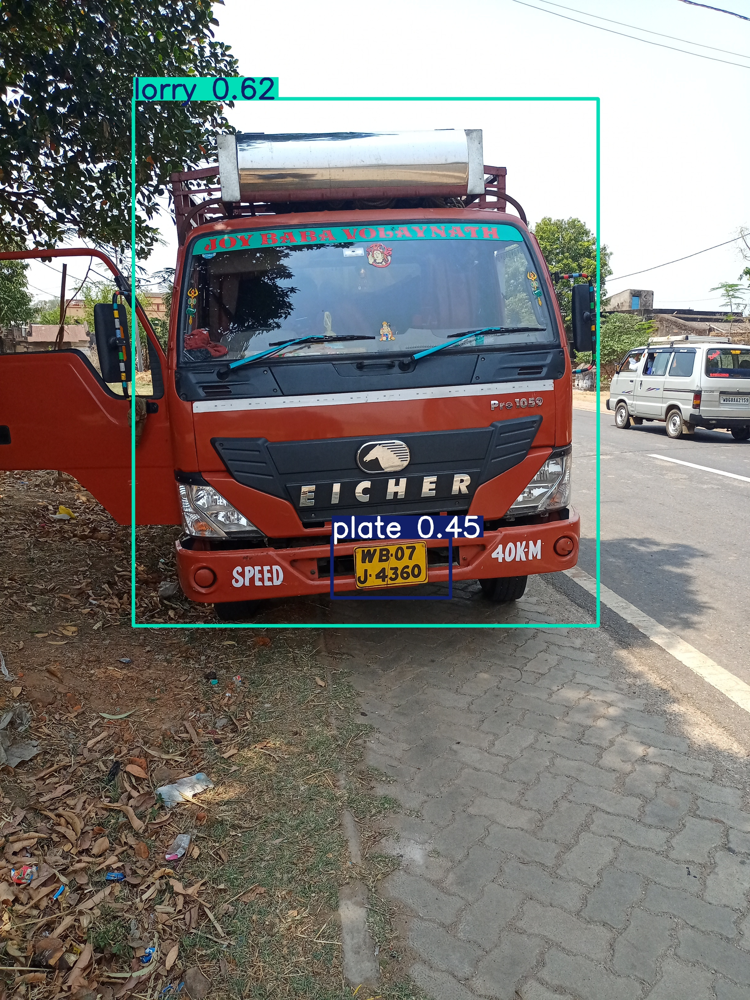

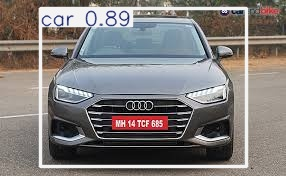

In [9]:
# testing the model with first 10 images
import glob
from IPython.display import Image, display
for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg')[:10]: # change the images input number
  display(Image(filename=image_path, height=400))
  print('\n')


In [10]:
!mkdir /content/my_model
!cp /content/runs/detect/train/weights/best.pt /content/my_model/my_model.pt
!cp -r /content/runs/detect/train /content/my_model


%cd my_model
!zip /content/my_model.zip my_model.pt
!zip -r /content/my_model.zip train
%cd /content

/content/my_model
  adding: my_model.pt (deflated 8%)
  adding: train/ (stored 0%)
  adding: train/confusion_matrix.png (deflated 32%)
  adding: train/val_batch0_pred.jpg (deflated 13%)
  adding: train/train_batch450.jpg (deflated 10%)
  adding: train/train_batch2.jpg (deflated 4%)
  adding: train/train_batch452.jpg (deflated 11%)
  adding: train/args.yaml (deflated 53%)
  adding: train/labels_correlogram.jpg (deflated 41%)
  adding: train/results.png (deflated 6%)
  adding: train/BoxPR_curve.png (deflated 20%)
  adding: train/labels.jpg (deflated 32%)
  adding: train/train_batch1.jpg (deflated 6%)
  adding: train/results.csv (deflated 60%)
  adding: train/val_batch0_labels.jpg (deflated 13%)
  adding: train/confusion_matrix_normalized.png (deflated 29%)
  adding: train/train_batch0.jpg (deflated 6%)
  adding: train/weights/ (stored 0%)
  adding: train/weights/best.pt (deflated 8%)
  adding: train/weights/last.pt (deflated 8%)
  adding: train/BoxF1_curve.png (deflated 7%)
  adding: tra

In [11]:
from google.colab import files

files.download('/content/my_model.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>